In [2]:
import pandas as pd
from pandas import DataFrame
import joblib
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score, recall_score, f1_score

from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve
from random import random
from sklearn.metrics import confusion_matrix
import seaborn as sns
from scipy import stats

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, SGDClassifier
import numpy as np

# Feature Engineering

In [3]:
df = pd.read_csv('desafiocartola.csv')
df.set_index('GLOBO_ID',inplace=True)

In [4]:
df.head()

,anos_desde_criacao,anos_como_pro,pixels,rel_pont,rel_pat,totals,max_camp,min_camp,avg_3,avg_4,...,norm_escalacao,interacoes_g1,tempo_desperd,iteracao_volei,iteracao_atletismo,facebook_num,instagram_num,dif_melhoria,gplay_free,pro_target
GLOBO_ID,,,,,,,,,,,,,,,,,,,,,
125000,1,0,NaN,15.852910,2.524221,0,2584991,228710,1.000000,0.000000,...,0.0,0.210526,12023.315789,0.105263,4256.736842,0.0,0.0,0.990244,1,1
125001,3,0,1080x1776,6.200016,-10.069990,1,4397021,1801541,6.947368,0.894737,...,0.0,0.368421,7142.210526,0.342105,6931.868421,10.0,6.0,1.048780,1,1
125002,4,2,NaN,10.555542,1.406326,0,2446095,987044,4.078947,0.000000,...,0.0,0.026316,266.000000,0.026316,266.000000,7.0,2.0,0.975610,1,1
125003,4,0,NaN,13.266068,27.708168,0,3324990,738231,0.526316,0.105263,...,0.0,0.210526,8551.710526,0.105263,5348.631579,3.0,4.0,1.063415,1,1
125004,4,1,NaN,20.938437,18.264221,1,3471435,289215,5.000000,0.394737,...,0.0,8.052632,498551.631579,3.473684,267428.973684,4.0,7.0,1.068293,1,1


In [4]:
df.describe()

,anos_desde_criacao,anos_como_pro,rel_pont,rel_pat,totals,max_camp,min_camp,avg_3,avg_4,escalacoes,...,norm_escalacao,interacoes_g1,tempo_desperd,iteracao_volei,iteracao_atletismo,facebook_num,instagram_num,dif_melhoria,gplay_free,pro_target
count,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,1.276710e+05,1.276710e+05,127671.000000,127671.000000,127671.000000,...,127671.000000,127671.000000,1.276710e+05,127671.000000,1.276710e+05,127545.000000,127545.000000,127671.000000,127671.000000,127671.000000
mean,2.989395,0.628295,9.543045,9.117933,0.183338,3.315012e+06,1.339238e+06,1.654137,0.280258,3.109069,...,0.140584,5.313064,2.583594e+05,3.166843,1.664088e+05,3.399561,2.589557,0.847820,0.787563,0.478903
std,2.707430,1.021122,11.445816,21.893374,0.717938,1.655237e+06,1.638330e+06,1.774636,0.660245,3.903263,...,0.246076,14.645402,6.994974e+05,9.344980,4.785581e+05,118.101630,4.258558,0.299989,0.409034,0.499557
min,-1.000000,0.000000,-34.195774,-87.226147,0.000000,1.445100e+04,1.000000e+00,0.000000,0.000000,0.026316,...,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,2.299833,-6.744069,0.000000,2.042326e+06,1.989645e+05,0.628571,0.000000,1.131579,...,0.000000,0.060606,1.676917e+03,0.000000,0.000000e+00,1.000000,0.000000,0.814634,1.000000,0.000000
50%,3.000000,0.000000,12.137647,9.723168,0.000000,3.203099e+06,6.828930e+05,1.000000,0.000000,2.078947,...,0.000000,0.447368,1.857363e+04,0.131579,5.815684e+03,2.000000,0.000000,0.980488,1.000000,0.000000
75%,4.000000,1.000000,18.499884,23.984615,0.000000,4.415218e+06,1.810736e+06,2.000000,0.263158,3.763158,...,0.184211,3.210526,1.526967e+05,1.526316,8.397950e+04,4.000000,4.000000,1.039024,1.000000,1.000000
max,15.000000,3.000000,60.276966,197.034221,40.000000,7.586024e+06,7.034650e+06,9.947368,7.666667,209.157895,...,0.947368,741.447368,3.141491e+07,480.394737,2.267027e+07,39519.000000,43.000000,1.068293,1.000000,1.000000


## Estratégias:
 - Features de necessidade de tratamento de outliers discrepantes de acordo com os percentis : anos_como_pro, totals, avg4, norm_escalacao, facebook_num
 - Normalizar com min-max se a distribuicao não for gaussiana ou o desvio padrão for pequeno.
 - Features com distribuicoes positivas : raiz-quadrada, cubica ou log
 - Distribuicao negativa : valores negativos -log(abs(-x)), para 0 -> log(0+1)

linkmedium.com/data-hackers/normalizar-ou-padronizar-as-variáveis-3b619876ccc9

In [5]:
 df.isnull().sum()

anos_desde_criacao         0
anos_como_pro              0
pixels                114398
rel_pont                   0
rel_pat                    0
totals                     0
max_camp                   0
min_camp                   0
avg_3                      0
avg_4                      0
escalacoes                 0
norm_rodadas               0
norm_escalacao             0
interacoes_g1              0
tempo_desperd              0
iteracao_volei             0
iteracao_atletismo         0
facebook_num             126
instagram_num            126
dif_melhoria               0
gplay_free                 0
pro_target                 0
dtype: int64

In [6]:
 df.count()

anos_desde_criacao    127671
anos_como_pro         127671
pixels                 13273
rel_pont              127671
rel_pat               127671
totals                127671
max_camp              127671
min_camp              127671
avg_3                 127671
avg_4                 127671
escalacoes            127671
norm_rodadas          127671
norm_escalacao        127671
interacoes_g1         127671
tempo_desperd         127671
iteracao_volei        127671
iteracao_atletismo    127671
facebook_num          127545
instagram_num         127545
dif_melhoria          127671
gplay_free            127671
pro_target            127671
dtype: int64

## pixels contem 114k valores nulos para um total de 127k registros, ou deve ser retirado ou deve ser normalizado com os valores + frequentes

In [5]:
# como pixels é categórico por enquanto será retirado das análizes de scatter e matriz de correlação entre as features
qtd_columns = list(df.columns)
qtd_columns.remove("pixels")

In [8]:
qtd_columns

['anos_desde_criacao',
 'anos_como_pro',
 'rel_pont',
 'rel_pat',
 'totals',
 'max_camp',
 'min_camp',
 'avg_3',
 'avg_4',
 'escalacoes',
 'norm_rodadas',
 'norm_escalacao',
 'interacoes_g1',
 'tempo_desperd',
 'iteracao_volei',
 'iteracao_atletismo',
 'facebook_num',
 'instagram_num',
 'dif_melhoria',
 'gplay_free',
 'pro_target']

array([[<AxesSubplot:title={'center':'anos_desde_criacao'}>,
        <AxesSubplot:title={'center':'anos_como_pro'}>,
        <AxesSubplot:title={'center':'rel_pont'}>,
        <AxesSubplot:title={'center':'rel_pat'}>,
        <AxesSubplot:title={'center':'totals'}>],
       [<AxesSubplot:title={'center':'max_camp'}>,
        <AxesSubplot:title={'center':'min_camp'}>,
        <AxesSubplot:title={'center':'avg_3'}>,
        <AxesSubplot:title={'center':'avg_4'}>,
        <AxesSubplot:title={'center':'escalacoes'}>],
       [<AxesSubplot:title={'center':'norm_rodadas'}>,
        <AxesSubplot:title={'center':'norm_escalacao'}>,
        <AxesSubplot:title={'center':'interacoes_g1'}>,
        <AxesSubplot:title={'center':'tempo_desperd'}>,
        <AxesSubplot:title={'center':'iteracao_volei'}>],
       [<AxesSubplot:title={'center':'iteracao_atletismo'}>,
        <AxesSubplot:title={'center':'facebook_num'}>,
        <AxesSubplot:title={'center':'instagram_num'}>,
        <AxesSubplot:title

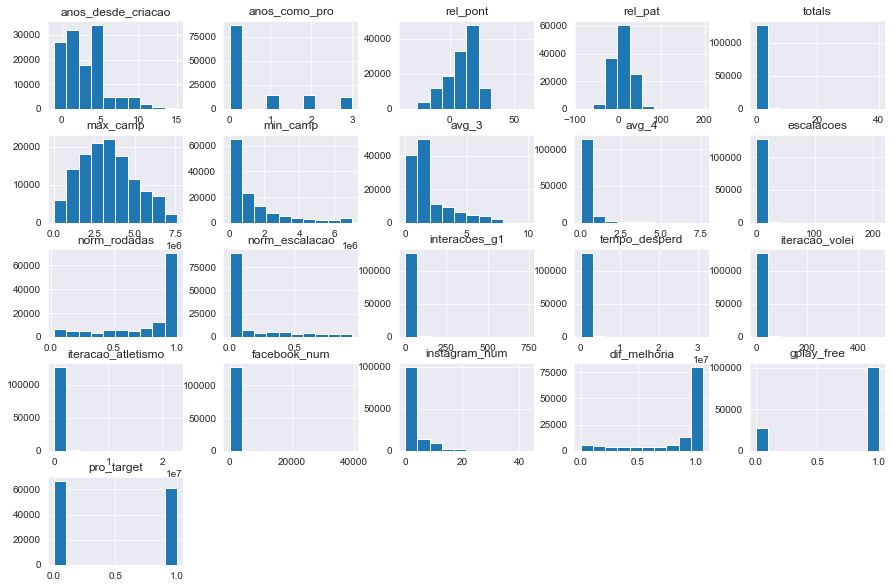

In [9]:
df[qtd_columns].hist(figsize=(15,10))

features para escalar e analisar : totals, avg_4, escalacoes, interacoes_g1, tempo_desperd, iteracao_volei, iteracao_atletismo, facebook_num
features com distribuicoes + simetricas : anos_desde_criacao, rel_pont, rel_pat, max_cam
features com distribuicoes negativas : min_camp, avg_3, avg_4
features com distribuicoes positivas : norm_rodadas
features com outliers : avg_4, norm_rodadas, norm_escalacao, instagram_num, df_melhoria

In [9]:
# Escalar
ft_min_max = ["anos_desde_criacao","anos_como_pro","totals", "escalacoes", "interacoes_g1", "tempo_desperd", "iteracao_volei", "iteracao_atletismo", "facebook_num"]
# Normalizar
ft_norm = ["norm_escalacao", "norm_rodadas","dif_melhoria", "instagram_num", "min_camp"]

<AxesSubplot:xlabel='pixels', ylabel='count'>

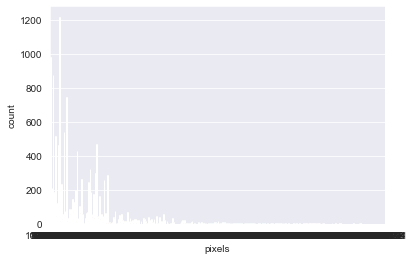

In [11]:
sns.countplot(x= 'pixels', data= df)

one-hot encoding de pixels daria muitas colunas

In [12]:
df.columns

Index(['anos_desde_criacao', 'anos_como_pro', 'pixels', 'rel_pont', 'rel_pat',
       'totals', 'max_camp', 'min_camp', 'avg_3', 'avg_4', 'escalacoes',
       'norm_rodadas', 'norm_escalacao', 'interacoes_g1', 'tempo_desperd',
       'iteracao_volei', 'iteracao_atletismo', 'facebook_num', 'instagram_num',
       'dif_melhoria', 'gplay_free', 'pro_target'],
      dtype='object')

In [13]:
def df_default_join(df_source: DataFrame, df_transformed: DataFrame, prefix="", on: str="GLOBO_ID", how: str="left"):
    if prefix:
        df_transformed.add_prefix(prefix)
    return df_source.join(df_transformed, on=on, how=how)

In [14]:
def one_hot_join(df: DataFrame, column: str, prefix: str,join_df=False):
    y = pd.get_dummies(df[column], prefix=prefix)
    if join_df:
        return df_default_join(df,y)
    else:
        return y

so testando one_hot para verificar distribuicao

In [15]:
one_hot_join(df[["anos_como_pro"]], "anos_como_pro", "acp").describe() # nao precisa ser one-hot

,acp_0,acp_1,acp_2,acp_3
count,127671.000000,127671.000000,127671.000000,127671.000000
mean,0.678071,0.113769,0.109954,0.098206
std,0.467218,0.317532,0.312834,0.297594
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000


In [16]:
one_hot_join(df[["anos_desde_criacao"]], "anos_desde_criacao", "adc").describe() # nao precisa ser one-hot

,adc_-1,adc_0,adc_1,adc_2,adc_3,adc_4,adc_5,adc_6,adc_7,adc_8,adc_9,adc_10,adc_11,adc_12,adc_13,adc_14,adc_15
count,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000
mean,0.010261,0.202176,0.142060,0.108795,0.139319,0.198416,0.066632,0.036328,0.018352,0.018845,0.023882,0.012235,0.016120,0.003681,0.001653,0.000909,0.000337
std,0.100775,0.401624,0.349113,0.311383,0.346280,0.398809,0.249385,0.187105,0.134221,0.135979,0.152681,0.109932,0.125936,0.060562,0.040620,0.030129,0.018349
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# VERIFICANDO CORRELACOES ANTES DE PADRONIZAR E NORMALIZAR

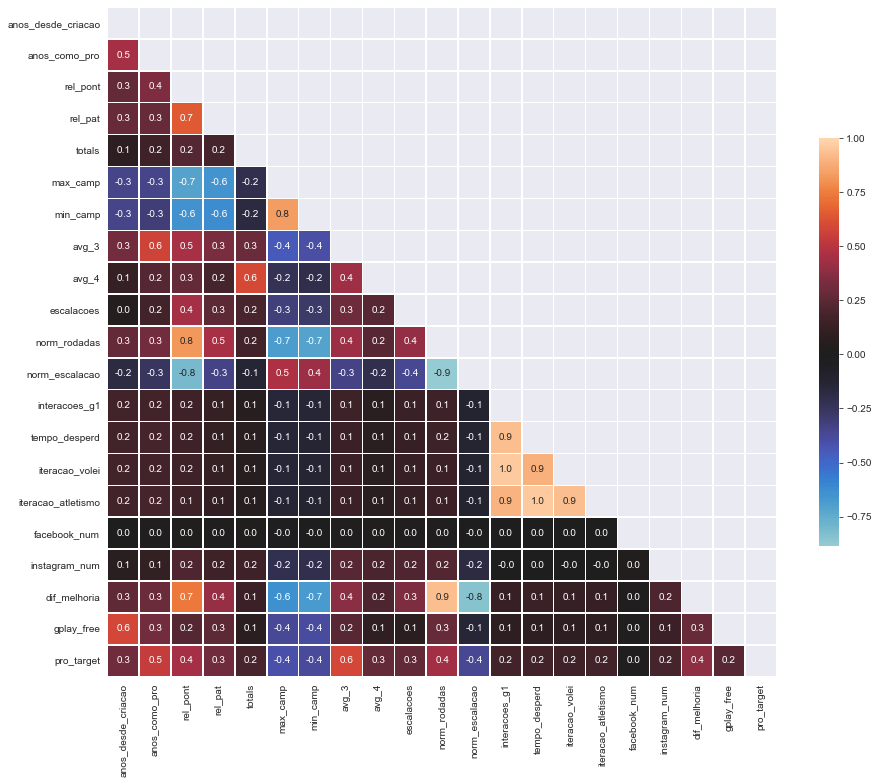

In [17]:
corr = df[qtd_columns].corr()

# Create a mask to hide the upper triangle of the correlation matrix (which is symmetric)
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corr, mask=mask, vmax=1, center=0, annot=True, fmt='.1f',
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

# correlacoes importantes:
- avg_3/anos_como_pro
- norm_rodadas/rel_pat
- df_melhoria/rel_pat
- df_melhoria/norm_rodadas
- interacao_atletismo/interacao_g1
- interacao_atletismo/tempo_desperd
- interacao_volei/interacao_g1

as interacoes com g1 inferem nas outras interacoes, pois g1 deve ser o portal de acesso à elas.

regredindo tudo com tudo apenas por curiosidade ... (a imagem ficou com labels pequenos, mas seguem a mesma ordem dos labels acima)

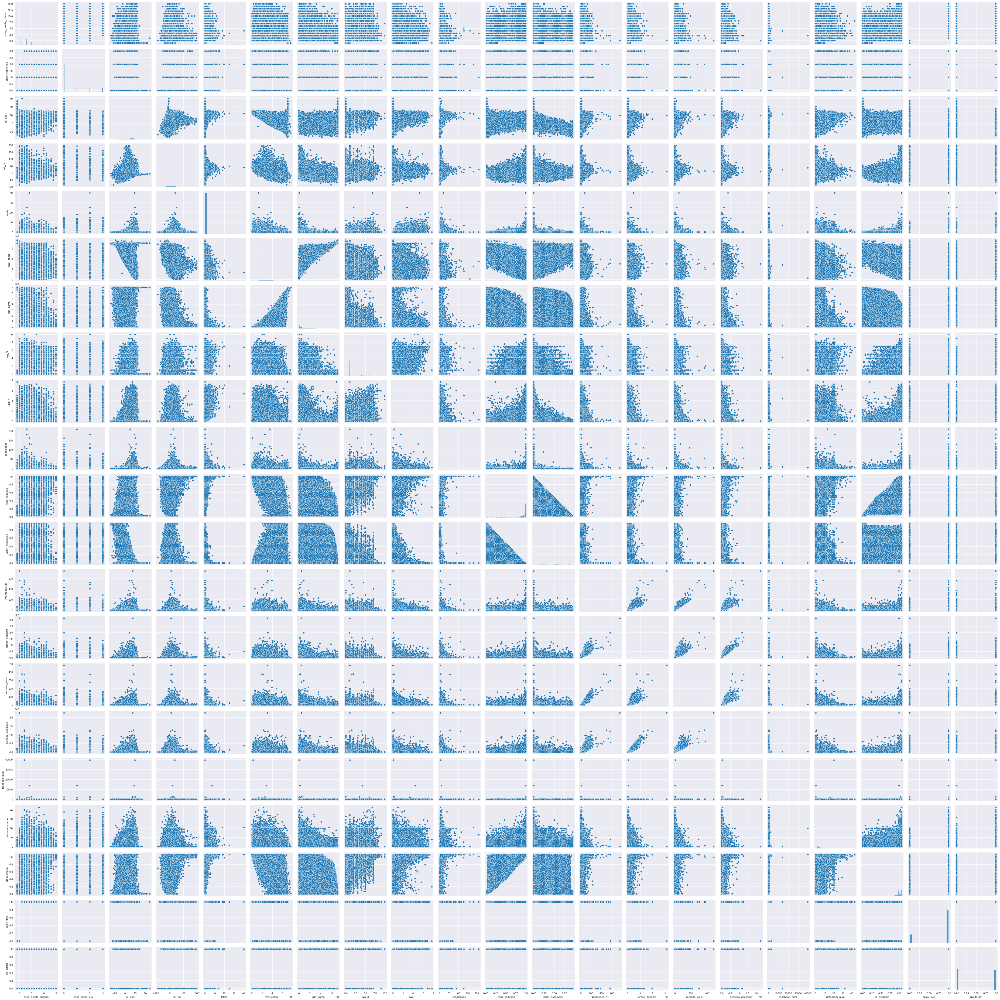

In [18]:
sns.pairplot(df[qtd_columns])

Como o target de predicao já é binário e escalado, não há necessidade de ser normalizado e padronizado com o resto do dataframe, portanto pode ser retirado

In [10]:
target = df[['pro_target']].copy()
df.drop('pro_target',axis=1, inplace=True)

KeyError: "None of [Index(['pro_target'], dtype='object')] are in the [columns]"

# Padronizando

In [20]:
df[ft_norm].dtypes

norm_escalacao    float64
norm_rodadas      float64
dif_melhoria      float64
instagram_num     float64
min_camp            int64
dtype: object

In [7]:
def get_long_tail(long):
    long = float(long)
    if long is None or 0:
        return np.log(1+long)
    elif long < 0:
        return -(np.log(np.abs(-long)))
    elif long > 0:
        return np.log(long)
    else:
        return 0

In [11]:
lista_columns_drop = list()
columns_log = list()
for column in ft_norm:
    _name = "log_"+column
    df[_name] = df[column].apply(get_long_tail)
    lista_columns_drop.append(column)
    columns_log.append(_name)

array([[<AxesSubplot:title={'center':'log_norm_escalacao'}>,
        <AxesSubplot:title={'center':'log_norm_rodadas'}>],
       [<AxesSubplot:title={'center':'log_dif_melhoria'}>,
        <AxesSubplot:title={'center':'log_instagram_num'}>],
       [<AxesSubplot:title={'center':'log_min_camp'}>, <AxesSubplot:>]],
      dtype=object)

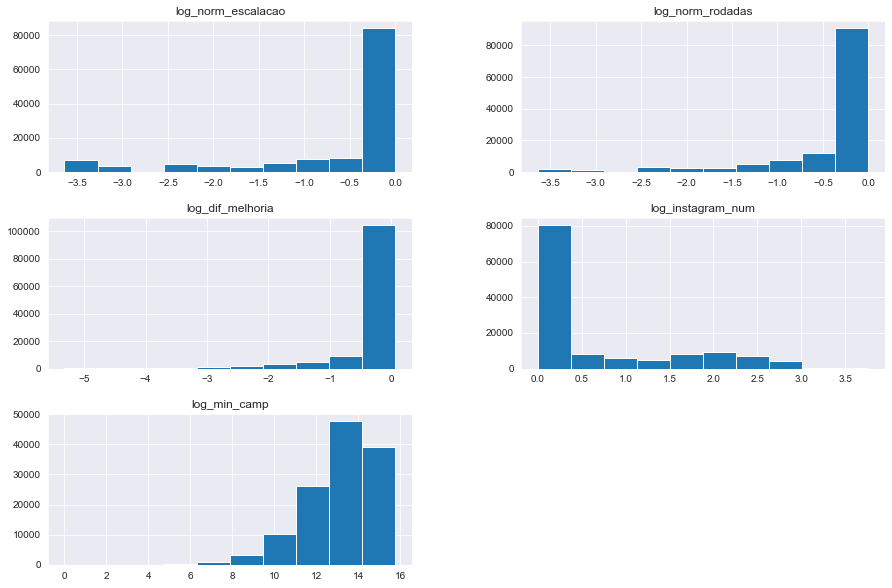

In [23]:
df[columns_log].hist(figsize=(15,10))

log_min_camp pode ser centrado, mas os outros ainda contem outliers

In [12]:
columns_std = list()
scallers_l = list()

In [13]:
import statistics
from sklearn.preprocessing import StandardScaler,PowerTransformer
def df_stdev(df: DataFrame, column: str, std_cut: int=1, rename_column=True):
    std_value = statistics.stdev(np.abs(df[column].values))*std_cut
    print(f"{column} std_value = {str(std_value)}")
    _column = str(column)
    if rename_column:
        _column = column + "_stdev_" + str(std_cut)
        df[_column] = df[column].values
    df.loc[df[_column] > std_value , _column] = std_value
    return _column

def df_stdscl(df: DataFrame, column: str, rename_column=True):
    # define standard scaler
    scaler = StandardScaler(with_std=True)
    # transform data
    scaled = scaler.fit_transform(df[column].to_numpy().reshape(-1, 1))
    _column = str(column)
    if rename_column:
        _column = column + "_stdscl_"
    df[_column] = scaled
    return scaler,_column

def df_stdpt(df: DataFrame, column: str, rename_column=True):
    # define standard scaler
    scaler = PowerTransformer(standardize=True)
    # transform data
    scaled = scaler.fit_transform(df[column].to_numpy().reshape(-1, 1))
    _column = str(column)
    if rename_column:
        _column = column + "_stdpt"
    df[_column] = scaled
    return scaler,_column

array([[<AxesSubplot:title={'center':'norm_escalacao_stdpt'}>,
        <AxesSubplot:title={'center':'norm_rodadas_stdpt'}>],
       [<AxesSubplot:title={'center':'dif_melhoria_stdpt'}>,
        <AxesSubplot:title={'center':'instagram_num_stdpt'}>],
       [<AxesSubplot:title={'center':'min_camp_stdpt'}>, <AxesSubplot:>]],
      dtype=object)

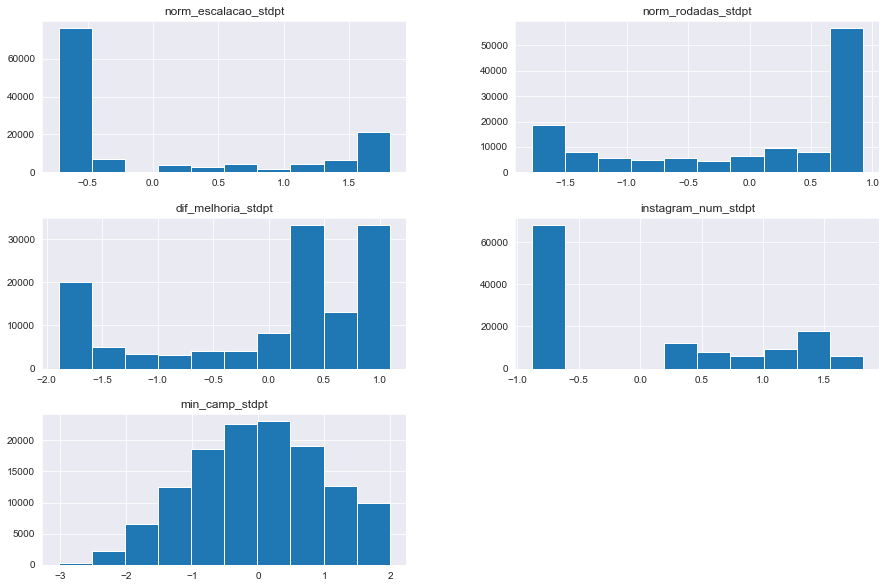

In [14]:
df.drop(columns=columns_std,axis=1,inplace=True)
columns_std.clear()
scallers_l.clear()
for column in ft_norm:
    _sclObj, _name = df_stdpt(df,column)
    columns_std.append(_name)
    scallers_l.append(_sclObj)
    lista_columns_drop.append(column)
df[columns_std].hist(figsize=(15,10))

In [15]:
# Lógica de Ceil
ceiled_columns = list()
ceil = lambda x: 1 if x >= 1 else x
for column in ['avg_3', 'avg_4']:
    _name = 'ceil_' + column
    df[_name] = df[column].apply(ceil)
    lista_columns_drop.append(column)
    ceiled_columns.append(_name)

array([[<AxesSubplot:title={'center':'ceil_avg_3'}>,
        <AxesSubplot:title={'center':'ceil_avg_4'}>]], dtype=object)

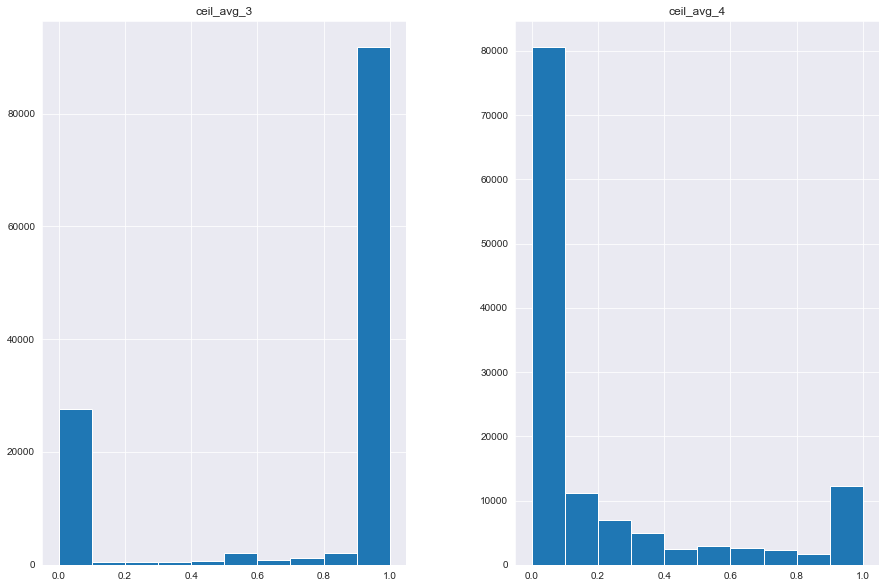

In [16]:
df[ceiled_columns].hist(figsize=(15,10))

array([[<AxesSubplot:title={'center':'avg_3_stdpt'}>,
        <AxesSubplot:title={'center':'avg_4_stdpt'}>]], dtype=object)

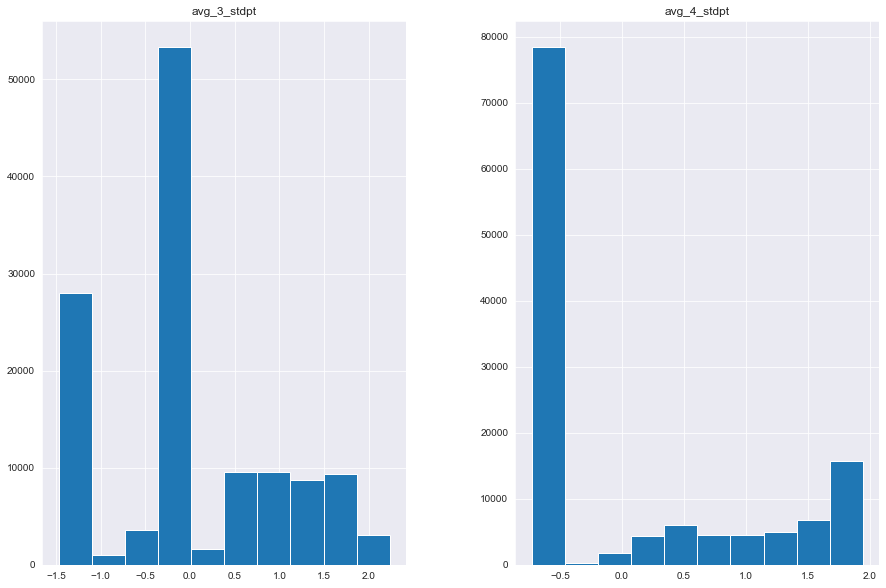

In [17]:
std_ceiled_columns = list()
for column in ['avg_3', 'avg_4']:
    _sclObj, _name = df_stdpt(df,column)
    std_ceiled_columns.append(_name)
    scallers_l.append(_sclObj)
    lista_columns_drop.append(column)
df[std_ceiled_columns].hist(figsize=(15,10))

In [18]:
# Gerar Proxy de Pixels para Renda

def get_total_pixels(pixels):
    if (pixels is None) | (type(pixels) != str):
        return None
    elif ('x' not in pixels) | (len(pixels.split('x'))<= 1):
        return None
    return float(pixels.split('x')[0])*float(pixels.split('x')[1])


df['total_pixels'] = df['pixels'].apply(get_total_pixels)
lista_columns_drop.append('pixels')

<AxesSubplot:>

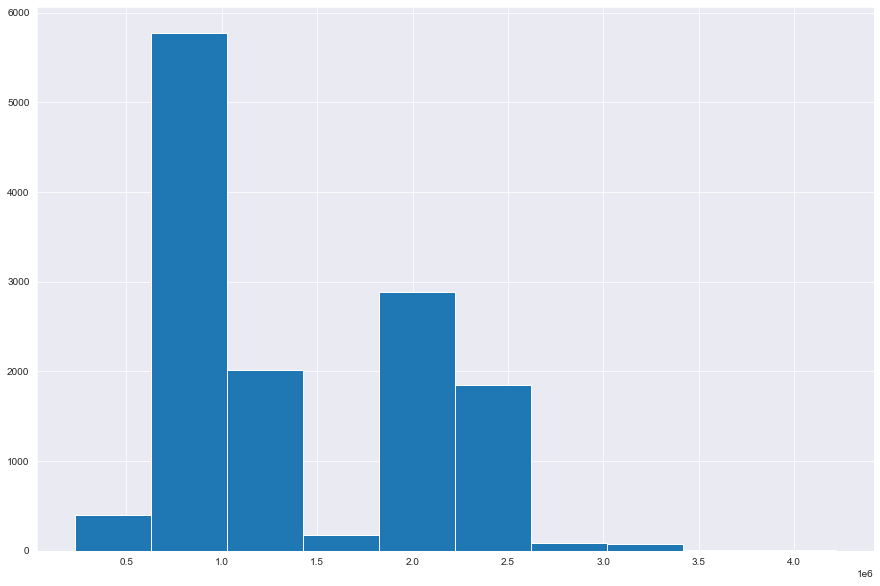

In [19]:
df['total_pixels'].hist(figsize=(15,10))

<AxesSubplot:>

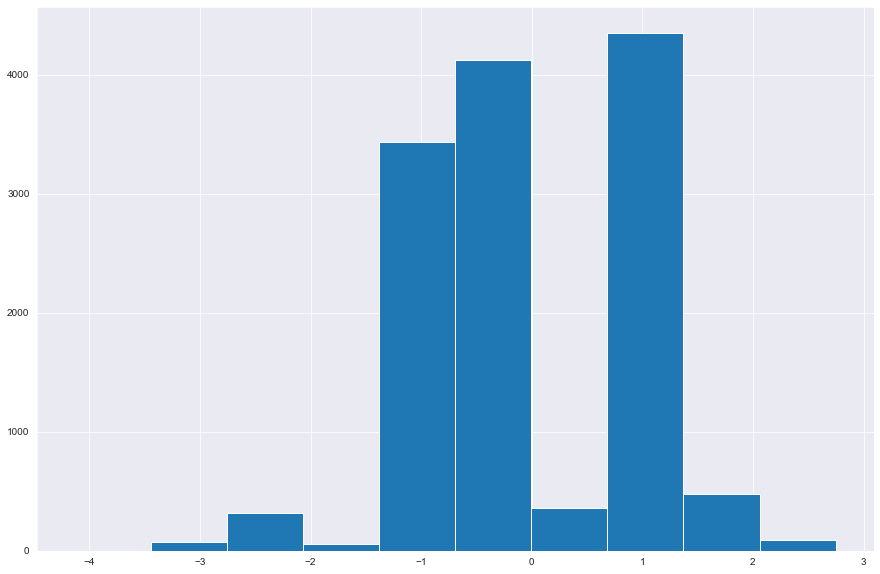

In [20]:
column = 'total_pixels'
_sclObj, _name = df_stdpt(df,column)
scallers_l.append(_sclObj)
df[_name].hist(figsize=(15,10))

In [21]:
lista_columns_drop.append(column)

In [22]:
X = df.drop(list(set(lista_columns_drop)),axis=1).copy()

In [35]:
X.describe()

,anos_desde_criacao,anos_como_pro,rel_pont,rel_pat,totals,max_camp,escalacoes,interacoes_g1,tempo_desperd,iteracao_volei,...,norm_escalacao_stdpt,norm_rodadas_stdpt,dif_melhoria_stdpt,instagram_num_stdpt,min_camp_stdpt,ceil_avg_3,ceil_avg_4,avg_3_stdpt,avg_4_stdpt,total_pixels_stdpt
count,127671.000000,127671.000000,127671.000000,127671.000000,127671.000000,1.276710e+05,127671.000000,127671.000000,1.276710e+05,127671.000000,...,1.276710e+05,1.276710e+05,1.276710e+05,1.275450e+05,1.276710e+05,127671.000000,127671.000000,1.276710e+05,1.276710e+05,1.327300e+04
mean,2.989395,0.628295,9.543045,9.117933,0.183338,3.315012e+06,3.109069,5.313064,2.583594e+05,3.166843,...,4.274243e-17,-2.021361e-16,6.233270e-17,1.123097e-16,-5.690085e-16,0.756605,0.192745,1.228845e-16,-6.411364e-17,1.331953e-14
std,2.707430,1.021122,11.445816,21.893374,0.717938,1.655237e+06,3.903263,14.645402,6.994974e+05,9.344980,...,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,0.412528,0.324963,1.000004e+00,1.000004e+00,1.000038e+00
min,-1.000000,0.000000,-34.195774,-87.226147,0.000000,1.445100e+04,0.026316,0.000000,0.000000e+00,0.000000,...,-7.202889e-01,-1.771425e+00,-1.892010e+00,-8.812232e-01,-3.015584e+00,0.000000,0.000000,-1.467764e+00,-7.269165e-01,-4.131964e+00
25%,1.000000,0.000000,2.299833,-6.744069,0.000000,2.042326e+06,1.131579,0.060606,1.676917e+03,0.000000,...,-7.202889e-01,-1.013953e+00,-6.919284e-01,-8.812232e-01,-7.170839e-01,0.628571,0.000000,-4.504980e-01,-7.269165e-01,-7.316886e-01
50%,3.000000,0.000000,12.137647,9.723168,0.000000,3.203099e+06,2.078947,0.447368,1.857363e+04,0.131579,...,-7.202889e-01,5.457681e-01,3.160489e-01,-8.812232e-01,7.448325e-03,1.000000,0.000000,-7.025137e-02,-7.269165e-01,-3.018037e-01
75%,4.000000,1.000000,18.499884,23.984615,0.000000,4.415218e+06,3.763158,3.210526,1.526967e+05,1.526316,...,1.059129e+00,9.215111e-01,8.108705e-01,1.109053e+00,7.237882e-01,1.000000,0.263158,6.061444e-01,9.453436e-01,1.062124e+00
max,15.000000,3.000000,60.276966,197.034221,40.000000,7.586024e+06,209.157895,741.447368,3.141491e+07,480.394737,...,1.809409e+00,9.215111e-01,1.091616e+00,1.813256e+00,1.989251e+00,1.000000,1.000000,2.232643e+00,1.941160e+00,2.748176e+00


In [36]:
X.dtypes

anos_desde_criacao        int64
anos_como_pro             int64
rel_pont                float64
rel_pat                 float64
totals                    int64
max_camp                  int64
escalacoes              float64
interacoes_g1           float64
tempo_desperd           float64
iteracao_volei          float64
iteracao_atletismo      float64
facebook_num            float64
gplay_free                int64
log_norm_escalacao      float64
log_norm_rodadas        float64
log_dif_melhoria        float64
log_instagram_num       float64
log_min_camp            float64
norm_escalacao_stdpt    float64
norm_rodadas_stdpt      float64
dif_melhoria_stdpt      float64
instagram_num_stdpt     float64
min_camp_stdpt          float64
ceil_avg_3              float64
ceil_avg_4              float64
avg_3_stdpt             float64
avg_4_stdpt             float64
total_pixels_stdpt      float64
dtype: object

In [23]:
pipe = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),  #Only numeric columns
        ('center', PowerTransformer(standardize=True)),
        ('sgd', SGDClassifier(loss='log', verbose=5, early_stopping=True, validation_fraction=0.3))
    ]
)

In [39]:
target

,pro_target
GLOBO_ID,
125000,1
125001,1
125002,1
125003,1
125004,1
...,...
252666,0
252667,0
252668,0


In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, target, train_size=0.7)

In [25]:
pipe.fit(X_train,y_train)

C:\Users\douglas.diniz.landim\Anaconda3\envs\datascience\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


-- Epoch 1
Norm: 4.95, NNZs: 28, Bias: 0.524039, T: 62558, Avg. loss: 1.336573
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 3.87, NNZs: 28, Bias: 0.022261, T: 125116, Avg. loss: 0.340050
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 3.55, NNZs: 28, Bias: 0.435999, T: 187674, Avg. loss: 0.296079
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 3.32, NNZs: 28, Bias: 0.293564, T: 250232, Avg. loss: 0.282375
Total training time: 0.12 seconds.
-- Epoch 5
Norm: 3.23, NNZs: 28, Bias: 0.303257, T: 312790, Avg. loss: 0.276109
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 3.32, NNZs: 28, Bias: 0.629965, T: 375348, Avg. loss: 0.271781
Total training time: 0.21 seconds.
Convergence after 6 epochs took 0.22 seconds


Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                ('center', PowerTransformer()),
                ('sgd',
                 SGDClassifier(early_stopping=True, loss='log',
                               validation_fraction=0.3, verbose=5))])

In [26]:
y_train_pred_prob = pipe.predict_proba(X_train)[:,1]
y_test_pred_prob = pipe.predict_proba(X_test)[:,1]

In [27]:
def roc_pr_curve(y, y_pred_prob, show=True):
    
    fig, axes = plt.subplots(figsize=(16, 10), ncols=2, nrows=1)

    y_random = [random() for _ in range(len(y))]

    ms_fpr, ms_tpr, _ = roc_curve(y, y_pred_prob)
    rs_fpr, rs_tpr, _ = roc_curve(y, y_random)

    ms_precision, ms_recall, _ = precision_recall_curve(y, y_pred_prob)
    rs_precision, rs_recall, _ = precision_recall_curve(y, y_random)
    
    ax = axes[0]
    ax.plot(ms_fpr, ms_tpr, color='#F76800')
    ax.plot(rs_fpr, rs_tpr, linestyle='--', color='#333333')
    ax.grid(True)
    ax.set_title('ROC Curve')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.scatter([], [], label='AUC: {:.02f}'.format(roc_auc_score(y, y_pred_prob)), color='#F76800')    
    ax.legend(loc='lower right')

    ax = axes[1]
    ax.plot(ms_recall, ms_precision, color='#F76800')
    ax.plot(rs_recall, rs_precision, linestyle='--', color='#333333')
    ax.grid(True)
    ax.set_title('Precision-Recall Curve')
    ax.set_xlabel('Recall')
    ax.set_ylabel('Precision')
    ax.scatter([], [], label='Random: {:.02f}'.format(auc(rs_recall, rs_precision)), color='#333333')
    ax.scatter([], [], label='Model: {:.02f}'.format(auc(ms_recall, ms_precision)), color='#F76800')
    ax.legend(loc='upper right')

    if not show:
        plt.close(fig)

    return fig, ax

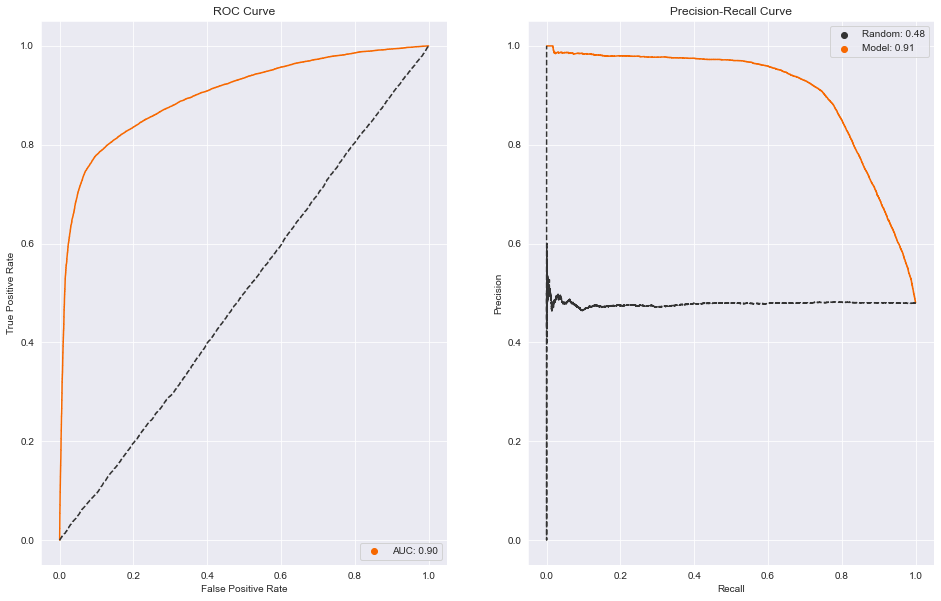

In [28]:
#eval
fig, ax = roc_pr_curve(y_test, y_test_pred_prob, show=True)

In [29]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_prob)

In [32]:
import plotly.express as px
# Evaluating model performance at various thresholds
df = pd.DataFrame({
    'False Positive Rate': fpr,
    'True Positive Rate': tpr
}, index=thresholds)
df.index.name = "Thresholds"
df.columns.name = "Rate"

fig_thresh = px.line(
    df, title='TPR and FPR at every threshold',
    width=700, height=500
)

fig_thresh.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh.show()

# SCORE = 84%

In [34]:
pipe.score(X_test,y_test)

0.8389901310636521

In [36]:
import joblib
joblib.dump(pipe,'propension_model_new.joblib')

['propension_model_new.joblib']

In [37]:
joblib.dump(scallers_l,"propension_model_new_scallers_list.joblib")

['propension_model_new_scallers_list.joblib']

In [38]:
joblib.dump(X_train,"propension_model_new_X_train.joblib")
joblib.dump(X_test,"propension_model_new_X_test.joblib")
joblib.dump(y_train,"propension_model_new_y_train.joblib")
joblib.dump(y_test,"propension_model_new_y_test.joblib")

['propension_model_new_y_test.joblib']

In [4]:
import joblib

In [5]:
X_train = joblib.load("propension_model_new_X_train.joblib")
X_test = joblib.load("propension_model_new_X_test.joblib")
y_train = joblib.load("propension_model_new_y_train.joblib")
y_test = joblib.load("propension_model_new_y_test.joblib")